In [1]:
import os
os.chdir('..')
os.getcwd()

'/Users/signapoop/Desktop/fyp-graph-clustering'

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt

import pickle 
import numpy as np
import os

In [3]:
from core.EmbeddingDataSet import EmbeddingDataSet
from core.GraphDataBlock import GraphDataBlock
from util.plot_graph_embedding import plot_graph_embedding

In [4]:
parent_dir = os.path.abspath('..')
input_dir = os.path.join(parent_dir, 'data')

In [5]:
overwrite = 0

In [6]:
# Load results
#dataset_names = ['cora_test', 'citeseer_test']
dataset_names = ['cora_test', 'citeseer_test', 'pubmed_test']
labels = ['Cora', 'Citeseer', 'Pubmed']
save_path = 'plots.pdf'
if overwrite == 1:
    dataset_names = ['cora_test', 'citeseer_test']
#    dataset_names = ['cora_test', 'citeseer_test', 'pubmed_test', 'ms_academic']
    labels = ['Cora', 'Citeseer', 'Pubmed', 'MS Academic']
    save_path = 'plots1.pdf'
elif overwrite == 2:
    dataset_names = ['reddit_full', 'reddit_test']
    labels = ['Reddit Train', 'Reddit Test']
    save_path = 'plots2.pdf'
    
all_datasets = {}
all_y_pred = {}
for name in dataset_names:
    lookup_file = 'data/{}_plots.pkl'.format(name)
    with open(lookup_file, 'rb') as f:
        [y_pred, dataset] = pickle.load(f)
        all_y_pred[name] = y_pred
        if dataset is None:
            dataset = EmbeddingDataSet(name, input_dir, train=True)
            dataset.create_all_data(n_batches=1, shuffle=False)
        all_datasets[name] = dataset

Data blocks of length:  [2708]
Time to create all data (s) = 0.0467
Data blocks of length:  [3312]
Time to create all data (s) = 0.1222


In [7]:
all_results = {}
for name in dataset_names:
    lookup_file = 'data/{}_results.pkl'.format(name)
    with open(lookup_file, 'rb') as f:
        all_results[name] = pickle.load(f)[0]

In [8]:
import numpy as np
import scipy.sparse as sp
from bokeh.palettes import Category20_20, Category20b_20, Accent8
from matplotlib import collections  as mc
import matplotlib.pyplot as plt


def plot_graph_embedding(y_emb, labels, adj, line_alpha=0.2, s=7, ax=None, title=""):
    """
    Plots the visualization of graph-structured data
    Args:
        y_emb (np.array): low dimensional map of data points, matrix of size n x 2
        labels (np.array): underlying class labels, matrix of size n x 1
        adj (np.array): adjacency matrix
    """
    labels = np.array([int(l) for l in labels])
    adj = sp.coo_matrix(adj)

    colormap = np.array(Category20_20 + Category20b_20 + Accent8)

    if ax is None:
        f, ax = plt.subplots(1, sharex='col', figsize=(10, 8), dpi=300)
#     else:
#         ax.set_axis_off()

    #ax.get_xaxis().set_visible(True)
    ax.get_yaxis().set_visible(False)
    ax.set_title(title)

    # Plot edges
    p0 = y_emb[adj.row, :]
    p1 = y_emb[adj.col, :]
    p_0 = [tuple(row) for row in p0]
    p_1 = [tuple(row) for row in p1]

    classA = labels[adj.row]
    classB = labels[adj.col]
    mask = classA == classB
    edge_colormask = mask * (classA + 1) - 1

    lines = list(zip(p_0, p_1))
    lc = mc.LineCollection(lines, linewidths=0.5, colors=colormap[edge_colormask])
    lc.set_alpha(line_alpha)
    ax.add_collection(lc)

    ax.scatter(y_emb[:, 0], y_emb[:, 1], s=s, c=colormap[labels])

    ax.margins(0.05, 0.05)
    plt.autoscale(tight=True)
    plt.tight_layout()

In [9]:
file_number = {'cora_test': [0, 4, 10],
               'citeseer_test': [0, 4, 10],
               'pubmed_test': [0, 5, 10],
               'cora_ml': [0, 2, 10],
               'ms_academic': [0, 5, 10],
               'reddit_full': [0, 5, 10],
               'reddit_test': [0, 5, 10]}

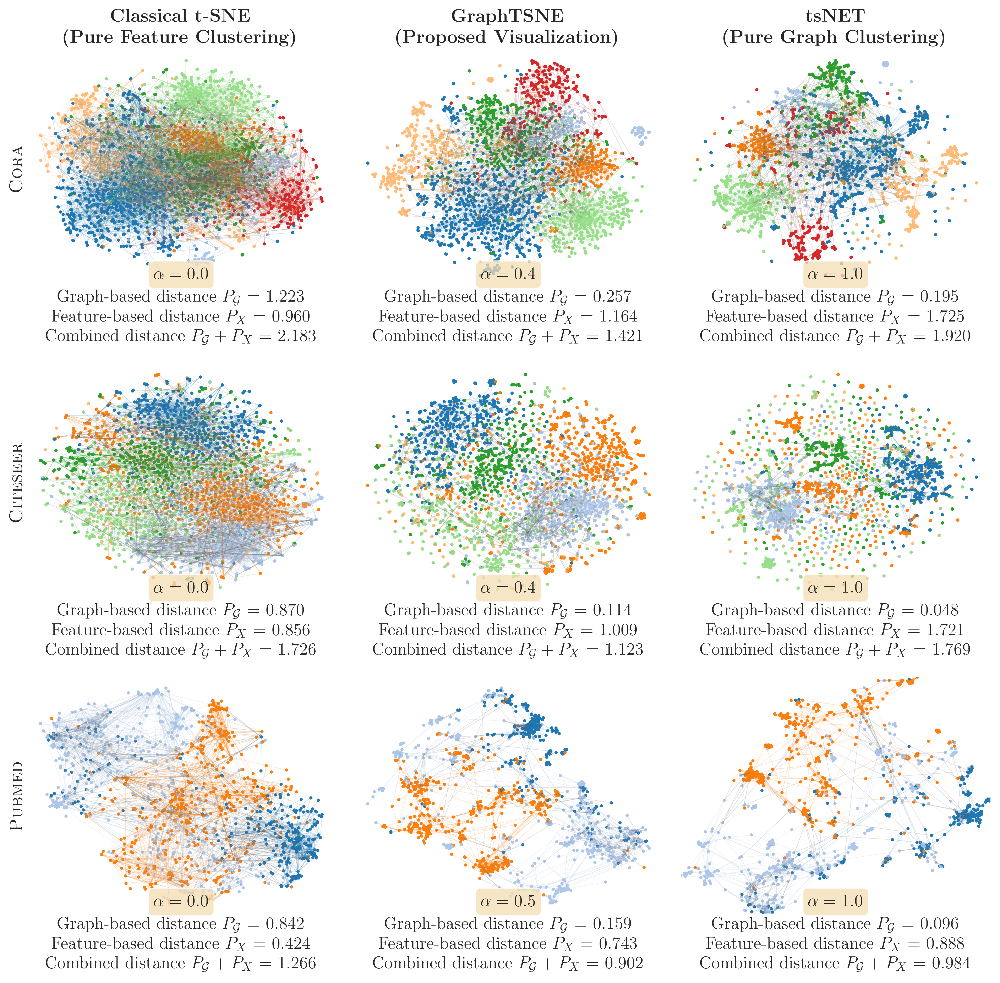

In [16]:
n_rows = len(dataset_names)
left_part = r'\textsc{'

titles = [r'$\textbf{Classical t-SNE}$' + '\n' + r'$\textbf{(Pure Feature Clustering)}$',
          r'$\textbf{GraphTSNE}$' + '\n' + r'$\textbf{(Proposed Visualization)}$', 
          r'$\textbf{tsNET}$' + '\n' + r'$\textbf{(Pure Graph Clustering)}$']
alphas = [0, 0.5, 1]

description_template = 'Graph-based distance $P_{\mathcal{G}}$ = %.3f \
                        \nFeature-based distance $P_{X}$ = %.3f \
                        \nCombined distance $P_{\mathcal{G}} + P_{X}$ = %.3f'

legend_size = 15
title_size = 16

import seaborn as sns
sns.set()
sns.set_style("whitegrid")

plt.rc('text', usetex=True)
plt.rc('font', family='serif')

props = dict(boxstyle='round', facecolor='wheat', alpha=0.75)

#f, axarr = plt.subplots(n_rows, 3, figsize=(12, 3.7*n_rows), dpi=400)
f, axarr = plt.subplots(n_rows, 3, figsize=(12, 4*n_rows), dpi=400)
for i, d_name in enumerate(dataset_names):
    dataset = all_datasets[d_name]
    result = all_results[d_name]
    file_numbers = file_number[d_name]
    for j, y_pred in enumerate(all_y_pred[d_name]):
        plot_graph_embedding(y_pred, dataset.labels, dataset.adj_matrix, line_alpha=0.1, s=3, ax=axarr[i,j])
        #axarr[i,j].set_rasterized(True)
        axarr[i,j].get_xaxis().set_major_locator(plt.NullLocator())
        axarr[i,j].get_xaxis().set_visible(True)
        description = description_template % (result['Avg graph distance'][file_numbers[j]], 
                                             result['Avg feature distance'][file_numbers[j]],
                                             result['Total distance'][file_numbers[j]])
        axarr[i,j].set_xlabel(description, fontsize=legend_size)
        for spine in axarr[i,j].spines.values():
            spine.set_visible(False)
        
        # For alpha label
        axarr[i,j].text(0.5, 0.05, r'$\alpha={}$'.format(str(file_numbers[j]/10)),         
            horizontalalignment='center',
            verticalalignment='center',
            bbox=props,
            transform=axarr[i,j].transAxes, fontsize=legend_size)

        if i == 0:
            axarr[i,j].set_title(titles[j], fontsize=title_size)
        
#         buffer = 0.03
#         l = -0.05
#         d = -0.32
        
#         axarr[i,j].patches.extend([plt.Rectangle((l,d),1-l+buffer,1-d+buffer,
#                                   fill=False, color='k', alpha=0.5, zorder=1000,
#                                   transform=axarr[i,j].transAxes)])
    
    axarr[i,0].text(0, 0.5, left_part + labels[i] + '}',         
        horizontalalignment='right',
        verticalalignment='center',
        rotation='vertical',
        transform=axarr[i,0].transAxes, fontsize=title_size)

plt.tight_layout()
plt.savefig('plots.png', format='png', dpi=400, bbox_inches="tight")    
plt.savefig(save_path, format='pdf', dpi=400, bbox_inches="tight")    